In [3]:
!pip install pandas
!pip install numpy 
!pip install scikit-learn
!pip install sklearn
!pip install category_encoders
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install xgboost
!pip install plotly_express
!pip install pdpbox

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.9.0rc1-py2.py3-none-any.whl size=258106 sha256=e7663d089acb119d812a7237cf050662f007a01e1b3f82171523223aacac7b7f
  Stored in directory: /tmp/pip-ephem-wheel-cache-ni4i_tk4/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [107]:
import pandas as pd
url = 'https://raw.githubusercontent.com/OhOmah/iRacing_Skill_Level/master/Road.csv'
# Importing my dataset
train = pd.read_csv(url)

# I'm looking to predict the iRating of a racer from the prospect of a team that is recruiting
# I am going to use Root Mean Squared Error to validate the accuracy of my data 

# Wrangling my data

In [5]:
train.describe()

,CUSTID,STARTS,WINS,AVG_START_POS,AVG_FINISH_POS,AVG_POINTS,TOP25PCNT,LAPS,LAPSLEAD,AVG_INC,IRATING,TTRATING,TOT_CLUBPOINTS,CHAMPPOINTS
count,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,237820.000000,2.378200e+05
mean,257171.333828,90.230834,5.697696,9.270007,9.412686,34.073825,20.386208,3477.218918,261.088071,5.625563,807.828009,701.091203,211.848928,4.582581e+03
std,152328.503103,278.287864,29.106402,2.870253,2.684389,18.668345,77.893967,12586.179777,1467.781668,3.643965,911.424081,656.585671,1034.019336,1.817179e+04
min,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,0.000000e+00
25%,118971.000000,3.000000,0.000000,7.000000,8.000000,22.000000,0.000000,55.000000,0.000000,3.530000,-1.000000,-1.000000,0.000000,7.500000e+01
50%,258738.000000,14.000000,0.000000,9.000000,9.000000,34.000000,2.000000,340.000000,5.000000,4.800000,780.000000,1162.000000,0.000000,4.850000e+02
75%,385878.250000,63.000000,3.000000,11.000000,11.000000,44.000000,12.000000,1821.000000,84.000000,6.860000,1410.000000,1350.000000,31.000000,2.356000e+03
max,539703.000000,14614.000000,1687.000000,43.000000,40.000000,206.000000,4377.000000,499270.000000,84890.000000,80.000000,10772.000000,3346.000000,45213.000000,1.050301e+06


In [6]:
train.head()

,DRIVER,CUSTID,LOCATION,CLUB_NAME,STARTS,WINS,AVG_START_POS,AVG_FINISH_POS,AVG_POINTS,TOP25PCNT,LAPS,LAPSLEAD,AVG_INC,CLASS,IRATING,TTRATING,TOT_CLUBPOINTS,CHAMPPOINTS
0,Ty Majeski,62032,US,Midwest,1204,919,2,2,134,1004,63047,52413,1.45,A 4.99,10772,2008,9767,161398
1,Tyler Majeski,138310,US,Midwest,1339,981,4,2,139,1147,62134,41439,2.29,A 4.99,10706,1653,9787,185693
2,James Curl,221548,US,Florida,1788,1097,3,3,125,1408,92020,53410,2.30,A 4.99,10064,1355,18930,223650
3,Daniel Williamson,22218,US,Virginias,1577,593,2,4,121,971,79889,32754,2.39,A 4.99,9345,1777,8651,190527
4,Bobby Zalenski,125400,US,California Club,460,121,6,7,150,276,32994,5806,2.47,P 4.99,9146,1429,2855,68870


In [7]:
from pandas_profiling import ProfileReport

#Grabbing a profile report of my training dataset
profile = ProfileReport(train.head(50000), title='IRacing Dataset', html={'style': {'full_width':True}}, sort='None')
profile

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [8]:
# Wrangling my data

def wrangle(x):
    # Making a copy of the original Dataframe so it won't return any errors 
    x = x.copy()
    # Dropping the columns that won't add to the data
    x = x.drop(['DRIVER', 'LOCATION', 'DRIVER', 'CUSTID', 'CLUB_NAME', 'TTRATING'], axis=1)
    # Dropping all the columns that are returning null values
    # Making a mask 
    mask = x['IRATING'] > 3 
    # First of going to take all the zeros and turn them into nulls in my iRating column
    x = x[mask]
    # Now I want to change the Class Rating to just the letter. 
    i = 0 
    # This for loop will keep the first character in the Class column (their licence class)
    for entry in x['CLASS']:
        x['CLASS'].iloc[i] = entry[0:1]
        i = i+1
        
    return x



In [9]:
tree = wrangle(train)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [10]:
print('train shape', train.shape)
print('tree shape', tree.shape)
tree.head()

train shape (237820, 18)
tree shape (127713, 13)


,STARTS,WINS,AVG_START_POS,AVG_FINISH_POS,AVG_POINTS,TOP25PCNT,LAPS,LAPSLEAD,AVG_INC,CLASS,IRATING,TOT_CLUBPOINTS,CHAMPPOINTS
0,1204,919,2,2,134,1004,63047,52413,1.45,A,10772,9767,161398
1,1339,981,4,2,139,1147,62134,41439,2.29,A,10706,9787,185693
2,1788,1097,3,3,125,1408,92020,53410,2.30,A,10064,18930,223650
3,1577,593,2,4,121,971,79889,32754,2.39,A,9345,8651,190527
4,460,121,6,7,150,276,32994,5806,2.47,P,9146,2855,68870


# Spliting my Data

In [11]:
# tests done, using my wrangle function and then splitting my data
X = tree.drop('IRATING', axis=1)
y = tree['IRATING']

# Now time to split my X and y variables into a train test split. 
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.2, train_size=.8)

# Establishing My Baseline

In [12]:
# Now it's time to establish my baseline using root mean square error 
# and building a basic model as my baseline 
from category_encoders import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import make_pipeline

baseline = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    DecisionTreeRegressor()
)

In [13]:
baseline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['CLASS'], drop_invariant=False,
                               handle_missing='value', handle_unknown='value',
                               return_df=True, use_cat_names=True, verbose=0)),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                       max_depth=None, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       presort='deprecated', random_state=None,
                                       splitter='best'))],
         verbose=False)

In [14]:
# Now gettting my baseline MAE 
from sklearn.metrics import mean_absolute_error
y_pred = baseline.predict(X_train)
y_pred_val = baseline.predict(X_val)

base = mean_absolute_error(y_train, y_pred)
print('Baseline MAE:', base)
print('Esentially for all my predictions, in average it would be', base, 'off')

#I'm curious and want to see how it compares with the validation set
print('Baseline Validation MAE:', mean_absolute_error(y_val, y_pred_val))

Baseline MAE: 0.008492381977749503
Esentially for all my predictions, in average it would be 0.008492381977749503 off
Baseline Validation MAE: 214.0780579154106


## Building a linear model 

In [15]:
import matplotlib.pyplot as plt

In [16]:
# My linear model
from sklearn.linear_model import LinearRegression
model_l = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    LinearRegression()
)
model_l.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['CLASS'], drop_invariant=False,
                               handle_missing='value', handle_unknown='value',
                               return_df=True, use_cat_names=True, verbose=0)),
                ('linearregression',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

In [17]:
# Testing my linear regression
y_pred = model_l.predict(X_train)
y_pred_val = model_l.predict(X_val)
print('My MAE with my training Data:',mean_absolute_error(y_train, y_pred))
print('My MAE with my validataion Data:',mean_absolute_error(y_val, y_pred_val))

My MAE with my training Data: 204.368626736441
My MAE with my validataion Data: 206.8223953924334


# Building my First Model

In [18]:
# Time to build my actual first model
# My baseline is extremely overfit, but somehow my validation is in a good start. 
from category_encoders import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor

# Starting basic, and seeing how much a difference RandomForestRegressor makes
model = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    RandomForestRegressor(n_estimators=200, max_depth=12)
)

In [19]:
model.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['CLASS'], drop_invariant=False,
                               handle_missing='value', handle_unknown='value',
                               return_df=True, use_cat_names=True, verbose=0)),
                ('randomforestregressor',
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=12,
                                       max_features='auto', max_leaf_nodes=None,
                                       max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       n_estimators=200, n_jobs=None,
                                       oob_scor

In [20]:
# Now comparing and seeing if my data is overfit or not 
y_pred = model.predict(X_train)
y_pred_val = model.predict(X_val)
print('My MAE with my training Data:',mean_absolute_error(y_train, y_pred))
print('My MAE with my validataion Data:',mean_absolute_error(y_val, y_pred_val))

My MAE with my training Data: 129.47569629824574
My MAE with my validataion Data: 152.3278281565018


In [21]:
# Before I explore any further I want to get as much information as possible from my model. 
# I am grabbing the feature importances of my model. 
fi = model.named_steps['randomforestregressor'].feature_importances_
names = model.named_steps['onehotencoder'].feature_names
importances = pd.Series(fi, names)
importances.sort_values(ascending=False)

AVG_POINTS        0.831611
TOP25PCNT         0.078135
LAPSLEAD          0.012599
CHAMPPOINTS       0.012165
WINS              0.011922
STARTS            0.011842
AVG_INC           0.008437
LAPS              0.007241
TOT_CLUBPOINTS    0.007085
AVG_FINISH_POS    0.007048
CLASS_A           0.006210
AVG_START_POS     0.002848
CLASS_B           0.001212
CLASS_P           0.000928
CLASS_C           0.000476
CLASS_D           0.000241
dtype: float64

In [22]:
# plotting my feature importances

# Now adding SelectKBest

In [23]:
from sklearn.feature_selection import SelectKBest

model_k = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    SelectKBest(),
    RandomForestRegressor(n_estimators=200, max_depth=15)
)

model_k.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['CLASS'], drop_invariant=False,
                               handle_missing='value', handle_unknown='value',
                               return_df=True, use_cat_names=True, verbose=0)),
                ('selectkbest',
                 SelectKBest(k=10,
                             score_func=<function f_classif at 0x7f5993af7c80>)),
                ('randomforestregressor',
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=15,
                                       max_features='auto', max_leaf_nodes=None,
                                       max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                     

In [24]:
# Now Comparing my MAEs to see how more/less accurate my model has become
y_pred = model_k.predict(X_train)
y_pred_val = model_k.predict(X_val)
print('My MAE with my training Data:',mean_absolute_error(y_train, y_pred))
print('My MAE with my validataion Data:',mean_absolute_error(y_val, y_pred_val))

My MAE with my training Data: 112.96082750332192
My MAE with my validataion Data: 157.042663153348


### Turns out with SelectKBest My model got worse 

## Now building a model with StandardScaler

In [25]:
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor 
import xgboost as xgb

model_s = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    StandardScaler(),
    RandomForestRegressor(n_estimators=200, max_depth=15)
)
model_s.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['CLASS'], drop_invariant=False,
                               handle_missing='value', handle_unknown='value',
                               return_df=True, use_cat_names=True, verbose=0)),
                ('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('randomforestregressor',
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=15,
                                       max_features='auto', max_leaf_nodes=None,
                                       max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
      

In [26]:
y_pred = model_s.predict(X_train)
y_pred_val = model_s.predict(X_val)
print('My MAE with my training Data:',mean_absolute_error(y_train, y_pred))
print('My MAE with my validataion Data:',mean_absolute_error(y_val, y_pred_val))

My MAE with my training Data: 106.14898280200988
My MAE with my validataion Data: 151.2965325216886


### Standard Scaler actually helped with my model
Now engineering a new feature to see how it would help. 

## Let's boost our model with XGBboost 

In [80]:
# Assigning my encoder 
from sklearn.preprocessing import OrdinalEncoder
model_encode = OrdinalEncoder()

# Encoding my x_train and naming it XT_train
XT_val = model_encode.fit_transform(X_val, y_val)
XT_train = model_encode.fit_transform(X_train, y_train)

# Assigning my XGBRegressor
model_x = XGBRegressor(n_estimators=200, n_jobs=2)

#Fitting my regressor. 
model_x.fit(XT_train, y_train)


[15:17:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=200,
             n_jobs=2, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [75]:
'''This was originally the pipline for the XGB Regressor, 
   for me to plot my feature importances I have to do it 
   seperatly and not in a pipeline

from xgboost import XGBRegressor 
model_x = make_pipeline(
    OneHotEncoder(use_cat_names=True, cols='CLASS'),
    StandardScaler(),
    XGBRegressor(n_estimators=200, n_jobs=1)
)
model_x.fit(X_train, y_train)
'''

"This was originally the pipline for the XGB Regressor, \n   for me to plot my feature importances I have to do it \n   seperatly and not in a pipeline\n\nfrom xgboost import XGBRegressor \nmodel_x = make_pipeline(\n    OneHotEncoder(use_cat_names=True, cols='CLASS'),\n    StandardScaler(),\n    XGBRegressor(n_estimators=200, n_jobs=1)\n)\nmodel_x.fit(X_train, y_train)\n"

In [83]:
y_pred = model_x.predict(XT_train)
y_pred_val = model_x.predict(XT_val)
print('My MAE with my training Data:',mean_absolute_error(y_train, y_pred))
print('My MAE with my validataion Data:',mean_absolute_error(y_val, y_pred_val))

My MAE with my training Data: 147.9429428627781
My MAE with my validataion Data: 159.6993761623036


In [91]:

# We have our favored model, time to tune it 

# Assigning my encoder 
model_encode = OrdinalEncoder()

# Encoding my x_train and naming it XT_train
XT_train = model_encode.fit_transform(X_train, y_train)
XT_val = model_encode.fit_transform(X_val, y_val)

# This time around I'm going to make my train and validation sets into dmatrices, to use the native XGBoost API
dtrain = xgb.DMatrix(XT_train, label=y_train)
dval = xgb.DMatrix(XT_val, label=y_val)

# Trying something new, going to assign my parameters to a seperate dictionary to tune later. 
params = { 
    'max_depth':6,
    'min_child_weight':1,
    'eta':.3,
    'subsample':1,
    'colsample_bytree':1,
    'objective':'reg:linear',
    'eval_metric': 'mae'
}
# Adding the number of rounds that my model will go through and when it should stop when it doesn't 
# get anymore accurate
num_boost_round = 999

model_tune = xgb.train(
    params,
    dtrain,
    num_boost_round=num_boost_round,
    evals=[(dval,'Validation')],
    early_stopping_rounds=10
)


[15:18:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	Validation-mae:1064.39
Will train until Validation-mae hasn't improved in 10 rounds.
[1]	Validation-mae:757.804
[2]	Validation-mae:547.355
[3]	Validation-mae:406.169
[4]	Validation-mae:314.294
[5]	Validation-mae:255.356
[6]	Validation-mae:217.905
[7]	Validation-mae:194.693
[8]	Validation-mae:180.413
[9]	Validation-mae:171.515
[10]	Validation-mae:166.19
[11]	Validation-mae:162.999
[12]	Validation-mae:161.101
[13]	Validation-mae:159.488
[14]	Validation-mae:158.602
[15]	Validation-mae:158.07
[16]	Validation-mae:157.493
[17]	Validation-mae:157.209
[18]	Validation-mae:156.691
[19]	Validation-mae:156.588
[20]	Validation-mae:156.604
[21]	Validation-mae:156.503
[22]	Validation-mae:156.391
[23]	Validation-mae:156.597
[24]	Validation-mae:156.763
[25]	Validation-mae:156.914
[26]	Validation-mae:156.951
[27]	Validation-mae:156.918
[28]	Validation-mae:156.914
[29]	Valida

In [92]:

# Looking at the best MAE I got from tuning my model. 
print("Best Val MAE: {:.2f} with {} rounds".format(
                 model_tune.best_score,
                 model_tune.best_iteration+1) )


Best Val MAE: 156.39 with 23 rounds


In [93]:

# Now running a cross validation to help tune my model even further

cv = xgb.cv(
    params,
    dtrain,
    num_boost_round=num_boost_round,
    seed=42,
    nfold=5,
    metrics={'mae'},
    early_stopping_rounds=10
)

cv


[15:19:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:19:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:19:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:19:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:19:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,train-mae-mean,train-mae-std,test-mae-mean,test-mae-std
0,1053.916821,0.657302,1053.964404,3.148852
1,739.978845,0.506906,740.067602,2.991969
2,525.260559,0.387020,525.540808,2.773422
3,382.274011,0.322982,382.929163,2.420220
4,289.933777,0.185523,291.000787,2.386333
...,...,...,...,...
83,125.068185,0.466956,147.287720,1.298833
84,124.882965,0.444878,147.260605,1.272256
85,124.698816,0.429151,147.241461,1.280019
86,124.539540,0.475057,147.223392,1.243693


In [94]:

# Grabbing my best mae from the cross validation
cv['test-mae-mean'].min()


147.1814698

In [ ]:
# Now doing a grid search to help tune my model
'''
from sklearn.model_selection import GridSearchCV

gridsearch_params= [
        (max_depth, min_child_weight)
        for max_depth in range(5,15)
        for min_child_weight in range(4,9)
]

min_mae = float('Inf')
best_params = None
for max_depth, min_child_weight in gridsearch_params:
  print("CV with max_depth={}, min_child_weight={}".format(
      max_depth,
      min_child_weight))
  
  # Update the parameters
  params['max_depth'] = max_depth
  params['min_child_weight'] = min_child_weight

  # Running cross validation
  cv = xgb.cv(
      params,
      dtrain,
      num_boost_round=num_boost_round,
      nfold=5,
      seed=42,
      metrics={'mae'},
      early_stopping_rounds=10
  )

  # Updating the best mae after the cross validation
  best_mae = cv['test-mae-mean'].min()
  boost_rounds = cv['test-mae-mean'].argmin()
  print("\tMAE {} for {} rounds".format(best_mae, boost_rounds))
  if best_mae < min_mae:
      min_mae = best_mae
      best_params = (max_depth,min_child_weight)
  
  print("Best params: {}, {}, MAE: {}".format(best_params[0], best_params[1], min_mae))

  '''


# Let's take a break real quick, Let's look at the performance of all my models

(Keep in mind this is just based on my validation model, one model that has a lower accuracy than another based on the validation data might be more consistant than the others)



# Now let's make some visualzations

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


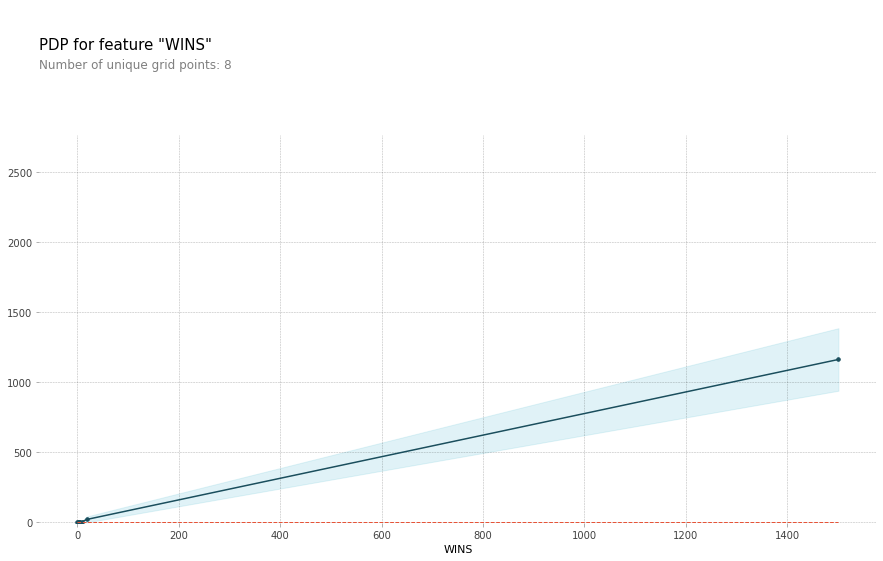

In [39]:
# My first plot will be a pdp plot. 
import matplotlib.pyplot as plt
from pdpbox.pdp import pdp_isolate, pdp_plot 

isolate = pdp_isolate(
    model= model_x,
    dataset=X_val,
    model_features=X_val.columns,
    feature='WINS'
)

pdp_plot(isolate, feature_name='WINS')
plt.show()

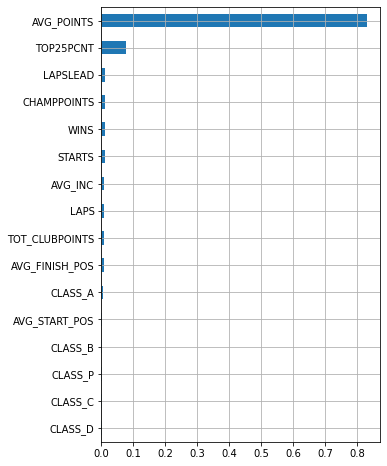

In [98]:
# Let's graph how important each feature is to my original model
regressor = model.named_steps['randomforestregressor']
feature_names = model.named_steps['onehotencoder'].feature_names

# Making the variables of my feature importances 
feat_important = regressor.feature_importances_
important = pd.Series(feat_important, index=feature_names)

#Plotting my feature importantes
plt.figure(figsize=(5,8))
importances.sort_values().plot(kind='barh')
plt.show()

## Odd, avg points seems to be the most crucial to my model, I'm going to take another look at it to see if it is a data leak 

Looking back at it now, the avg points column looks a the average points they get towards their championship per week, the higher score they get, means the more competitive the racer they are. Talk this over with everyone else to see what they think of the situation 

In [95]:
print(model_x.feature_importances_)

[0.02101235 0.02582159 0.00279813 0.01465276 0.69627637 0.10196737
 0.00758665 0.05393504 0.0053624  0.04043913 0.00606728 0.02408098]


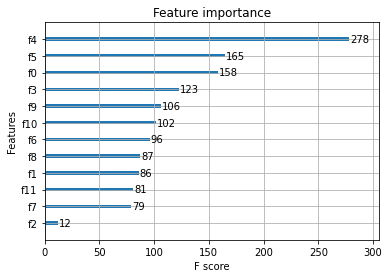

In [96]:
# Let's graph how important each feature is to my xgboost model
from xgboost import plot_importance

plot_importance(model_x)
plt.show()

## For my XGBoost Regressor it is much more even spread, everything was put into consideration. 

# Now looking at the relationship between iRating and the average champ points gained per week

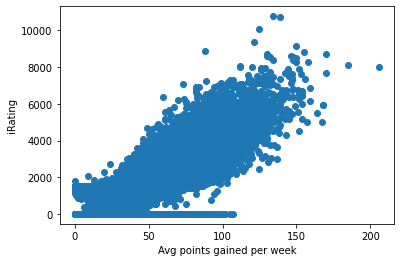

In [44]:
# my next graph will be the relationship between the AVG points and the iRating score 

plt.scatter(train['AVG_POINTS'], train['IRATING'])
plt.xlabel('Avg points gained per week')
plt.ylabel('iRating')
plt.show()

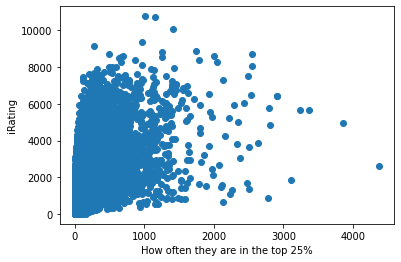

In [46]:
# Comparing this to the next important feature
plt.scatter(train['TOP25PCNT'], train['IRATING'])
plt.xlabel('How often they are in the top 25%')
plt.ylabel('iRating')
plt.show()

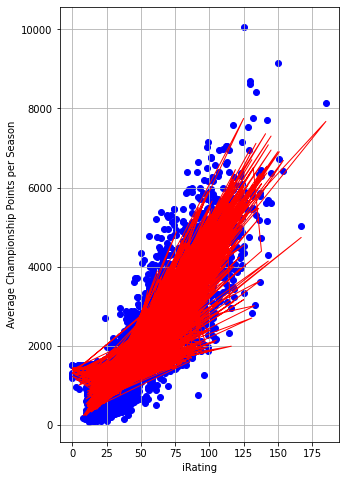

In [59]:
# This visualization is goint to be for the linear regression line
fig, ax = plt.subplots(figsize=(5,8))

ax.scatter(X_val['AVG_POINTS'], y_val, color='blue')
ax.plot(X_val['AVG_POINTS'], y_pred_val, linewidth=1, color='red')

# Setting my x and y labels 
ax.set_xlabel('iRating')
ax.set_ylabel('Average Championship Points per Season')

# Adding a grid
ax.grid('on')

plt.show()